In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import plotly.express as ex
import pandas as pd

from numpy import exp

from tracking.motion import ConstantVelocityModel, constant_velocity_models
from tracking.target import ConstantAccelerationTarget, ConstantVelocityTarget, SinusTarget, SingerTarget
from tracking.kalman import KalmanFilter6D
from tracking.evaluation import evaluate, monte_carlo, rmse, execute

from tracking.plot import boxplot_rmse, plot_position_errors, aggregated_errors, plot_aggregated_errors, plot_error_band
from tracking.util import to_df

## Constant-Velocity Target

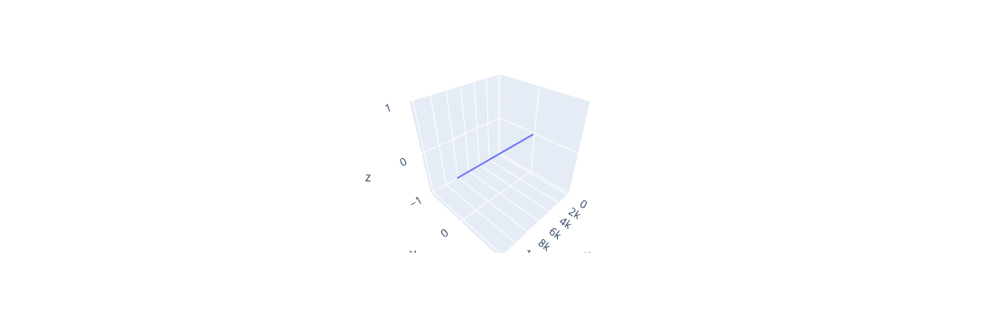

In [6]:
target = ConstantVelocityTarget()

fig = ex.scatter_3d(target.true_states_df(), x='x', y='y', z='z')
fig.update_traces(marker_size = 1)
fig

In [7]:
motion  = constant_velocity_models(.1 ,.5, 1, 2, 5, 10, 20)
z_sigma = [.87, 8.72, 87.2]
results = monte_carlo(target, motion, z_sigma)

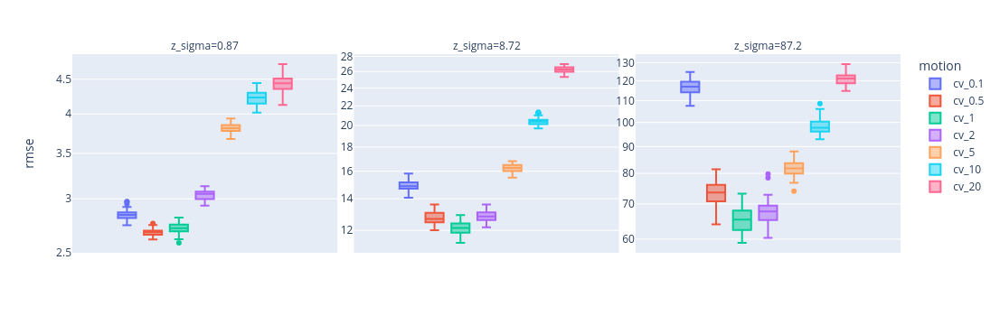

In [8]:
data = rmse(results)

fig=ex.box(data, y='rmse', color='motion', facet_col='z_sigma', log_y=True)
fig.update_xaxes(type='category')
fig.update_yaxes(matches=None, showticklabels=True)
fig

In [9]:
r = results.select(z_sigma=.87)[0]
r

EvaluationResult {'target': 'cv', 'motion': 'cv_0.1', 'z_sigma': 0.87, 'seed': 0, 'R': 0.7569}

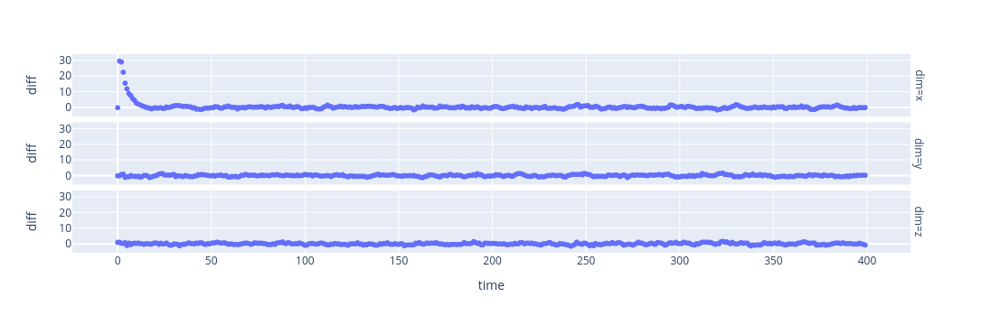

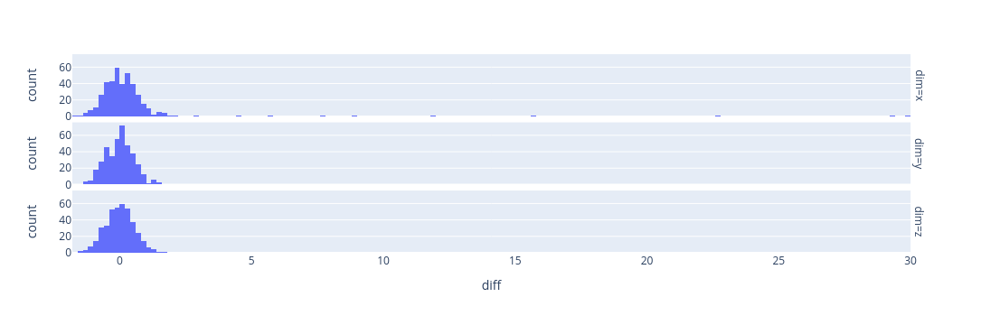

In [10]:
plot_position_errors(r)

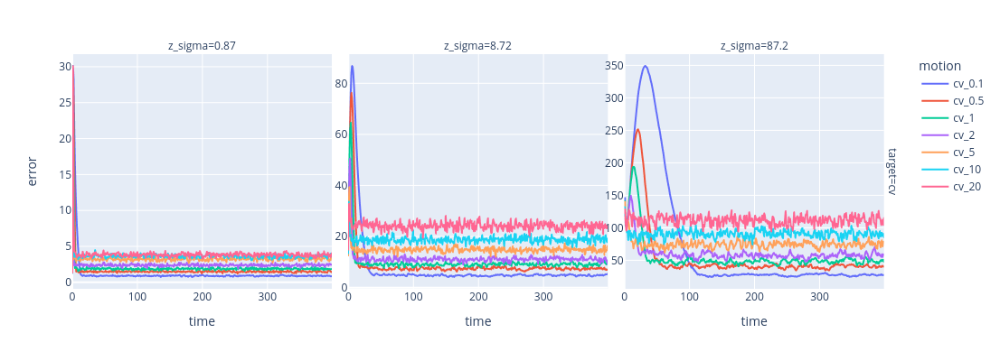

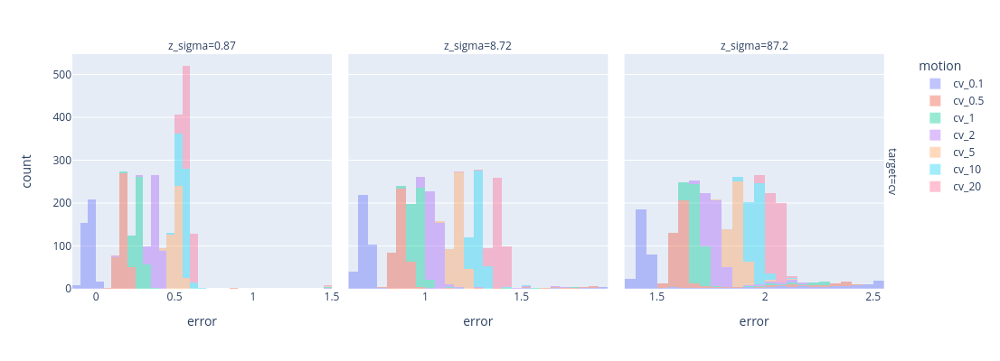

In [11]:
plot_aggregated_errors(results).update_layout(height=400)

## Constant-Acceleration Target

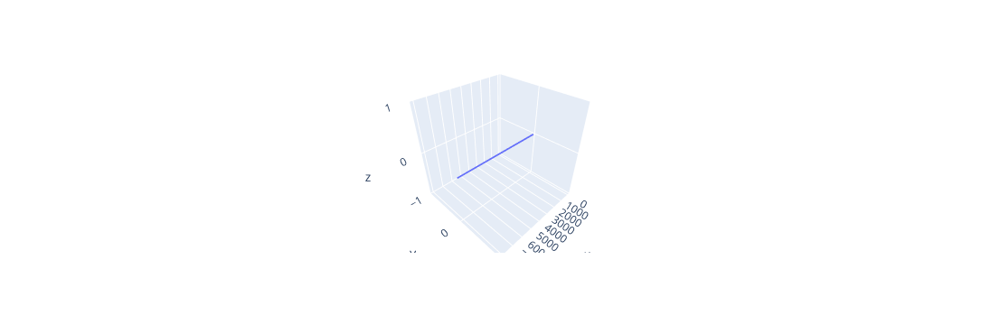

In [12]:
target = ConstantAccelerationTarget()

fig = ex.scatter_3d(target.true_states_df(), x='x', y='y', z='z')
fig.update_traces(marker_size = 1)
fig

In [13]:
targets = [ConstantAccelerationTarget(.1), ConstantAccelerationTarget(.5), ConstantAccelerationTarget(2)]
motion  = constant_velocity_models(.1 ,.5, 1, 2, 5, 10, 20)
z_sigma = [.87, 8.72, 87.2]
results = monte_carlo(targets, motion, z_sigma)

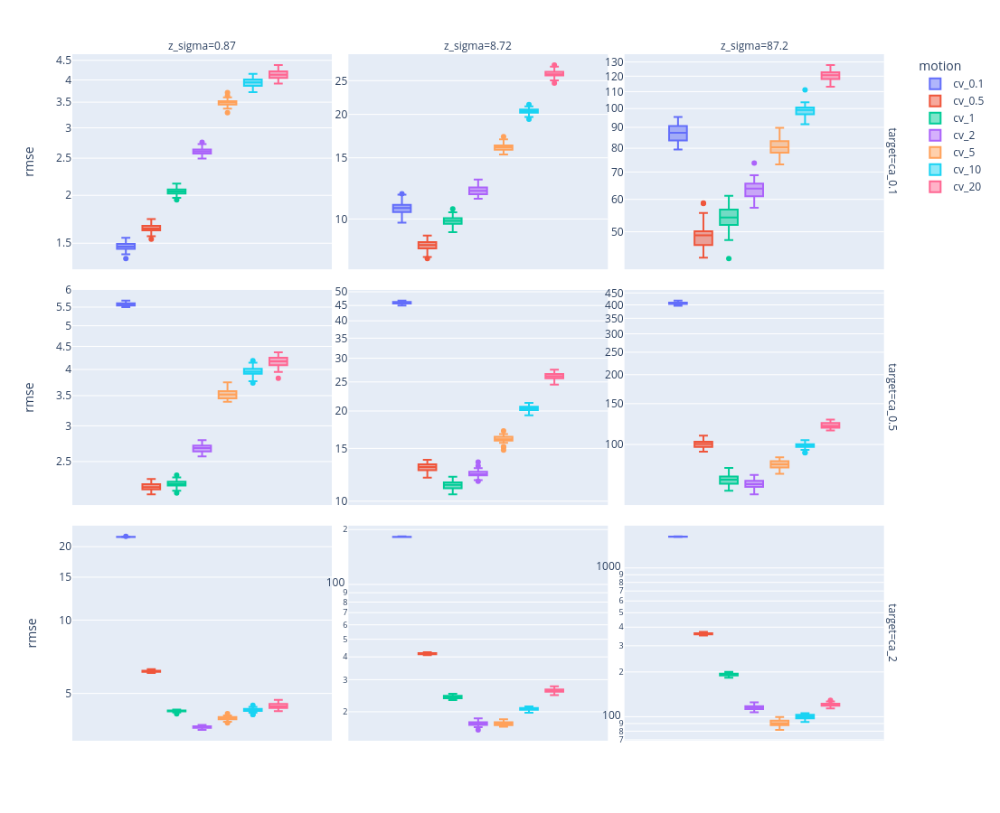

In [14]:
data = rmse(results)

fig=ex.box(data, y='rmse', color='motion', facet_col='z_sigma', facet_row='target', log_y=True)
fig.update_xaxes(type='category')
fig.update_yaxes(matches=None, showticklabels=True)
fig.update_layout(width=1100, height=900)
fig

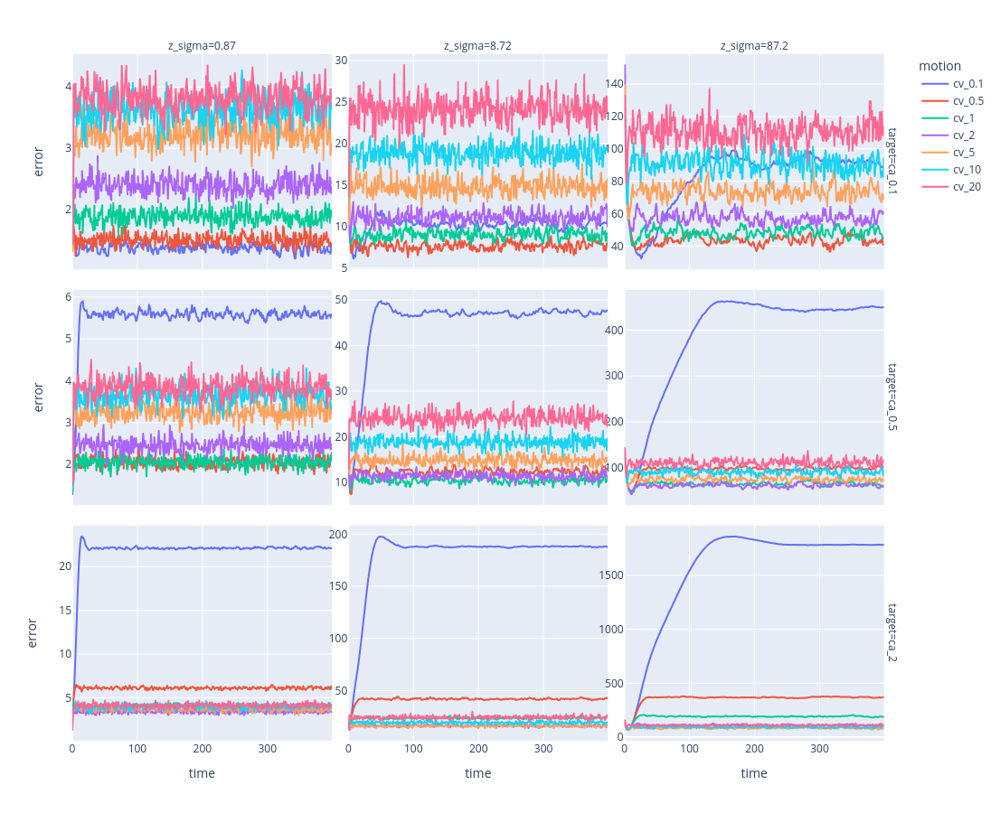

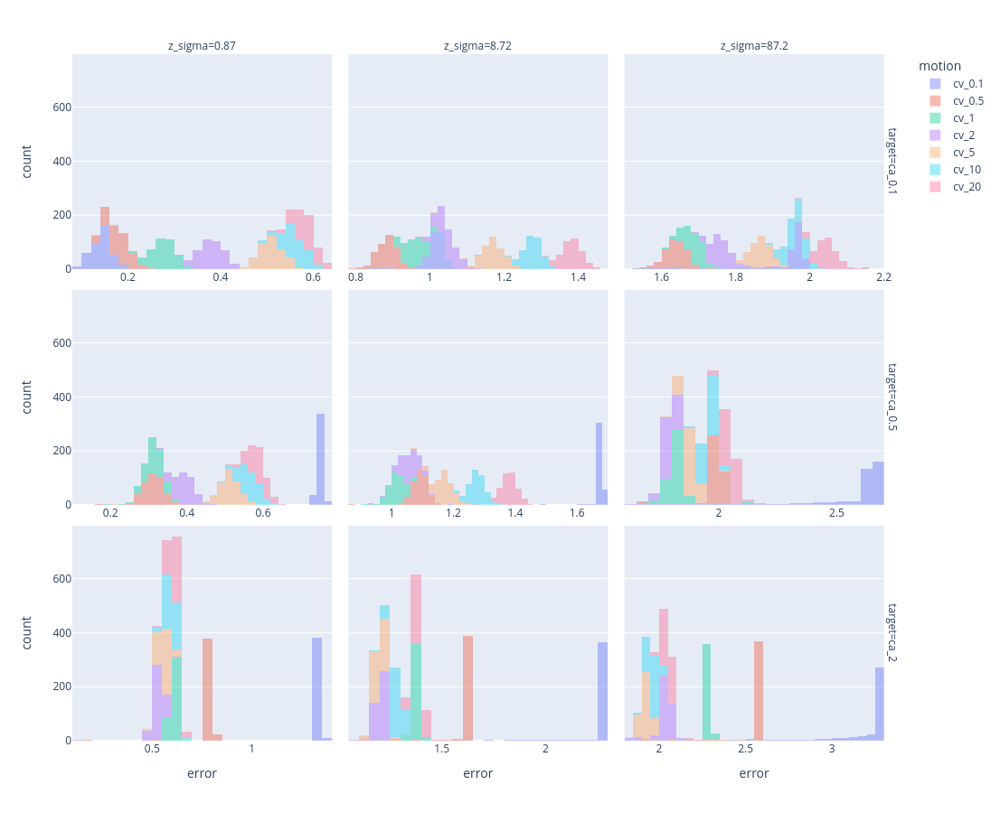

In [15]:
plot_aggregated_errors(results)

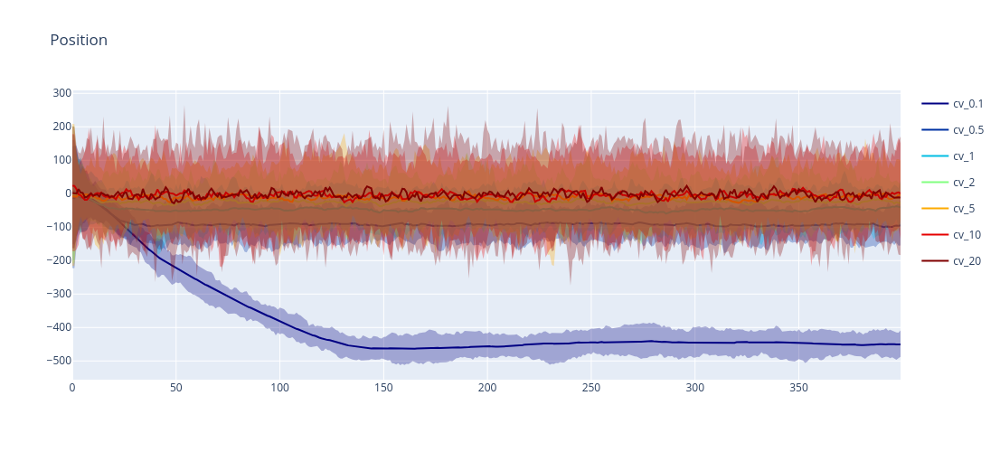

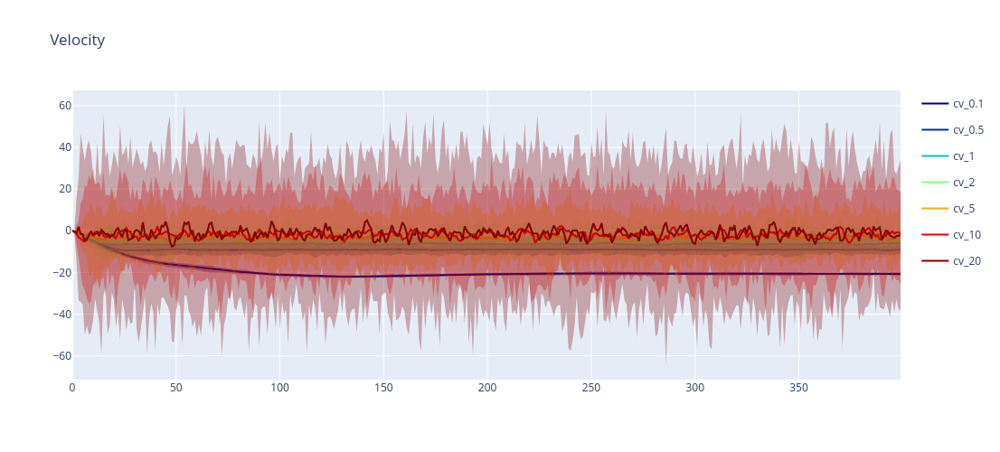

In [71]:
sel = results.select(target='ca_0.5', z_sigma='87.2')
plot_error_band(sel).update_layout(height=500)